In [1]:
import numpy as np
import matplotlib.pyplot as plt
import importlib
import json
import kwant
from dask_quantumtinkerer import Cluster, cluster_options
import adaptive
import pickle
from scipy.optimize import minimize

import codes.trijunction as trijunction
import codes.optimization as optimization
import codes.parameters as parameters
from codes.gate_design import gate_coords
from codes.finite_system import kwantsystem
from codes.system_functions import diagonalisation, adaptive_two_parameters
from codes.tools import hamiltonian
from codes.utils import eigsh, svd_transformation, dict_update, dep_acc_index, order_wavefunctions
from codes.constants import pairs, bands, topological_gap

VoronoiMesh version 0.1
DiscretePoisson version 0.3
Shape version: 0.1
SystEquations version: 0.3
Solver version 0.1


# Single system 

In [2]:
with open('/home/tinkerer/trijunction-design/codes/config.json', 'r') as f:
    config = json.load(f)

change_config = [
    {"device":
     {"grid_spacing":
      {"twoDEG": 1, "normal": 1, "dielectric": 1, "air": 5, "gate": 1, "substrate": 1}}},
    {"gate": {"channel_width": 13.0, 'angle': np.pi/6, 'gap': 4, 'L': 40}},
]

for local_config in change_config:
    config = dict_update(config, local_config)


In [4]:
system = trijunction.Trijunction(
    config, optimize_phase_pairs=[]
)

Finding closed voronoi cells
Done selecting closed voronoi cells
Calculating points distance
Done
Calculating ridges hypersurfaces
Done
Finding  hypervolume for closed voronoi cells
Done finding hypervolume for closed voronoi cells
Done calculating surface
Done calculating distance
Done calculating capacitance matrix


100%|██████████| 13/13 [00:07<00:00,  1.74it/s]


## Initial condition 

In [5]:
system.optimize_phase_pairs = ['right-top']

In [6]:
system.voltage_initial_conditions(guess=(-3e-3, -3e-3, -3e-3, 20e-3))

[-0.003 -0.003 -0.003  0.02 ]
[0.00315593 0.00384776] [[4.47116285e-04 3.23026976e-04 7.83183045e-05 1.00000000e-06]] [[  47.46750376 5989.60709721]
 [ 284.25534517 5989.60709721]]


capi_return is NULL
Call-back cb_calcfc_in__cobyla__user__routines failed.


TypeError: 'int' object is not subscriptable

In [ ]:
system.initial_conditions

In [12]:
system.initial_conditions = {
    'right-top': [-0.00289727, -0.013, -0.00359918,  0.02500424],
    'left-top': [-0.013, -0.00289727, -0.00359918,  0.02500424],
    'left-right': [-0.004, -0.004, -0.009,  0.03],
}    

In [7]:
params = parameters.junction_parameters()
params.update(potential=system.flat_potential())
base_ham = system.trijunction.hamiltonian_submatrix(
    sparse=True,
    params=system.f_params(**params)
)

In [13]:
lin_ham, full_ham = hamiltonian(
    base_ham,
    system.linear_terms,
    **parameters.voltage_dict(
        system.initial_conditions['left-right']
    )
)
lin_ham = lin_ham.diagonal()[::4]

In [20]:
evals, evecs = eigsh(full_ham, k=6, return_eigenvectors=True)
evals

array([-1.79197825e-05, -1.12846655e-07, -2.49679489e-11,  2.49679485e-11,
        1.12846655e-07,  1.79197825e-05])

/tmp/ipykernel_34241/304324756.py:2: RuntimeWarning: The plotted data contains 0.46% of values underflowing lower limit -0.00255507 
  kwant.plotter.map(system.trijunction, lambda i: np.real(lin_ham[i]), ax=ax[0])


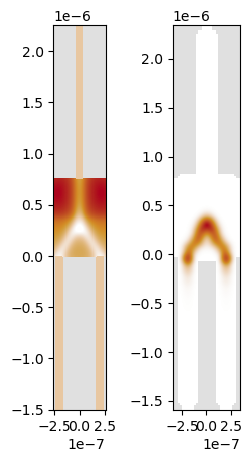

In [21]:
fig, ax = plt.subplots(ncols=2, figsize=(3, 5))
kwant.plotter.map(system.trijunction, lambda i: np.real(lin_ham[i]), ax=ax[0])
kwant.plotter.density(system.trijunction, optimization.density(evecs[:, -1]), ax=ax[1])

In [5]:
def wf_loss(x, *argv):
    """
    Function used to compute coupling energy, wavefunction_loss and loss
    as a function of two voltages with adaptive.
    """
    pair = argv[0]
    initial_condition = argv[1]
    system, linear_terms, reference_wavefunctions = argv[2]
    indices = argv[3]

    sides = ["left", "right", "top"]
    for i, key in enumerate(pair):
        if key in sides:
            initial_condition[sides.index(key)] = xy[i]

    params = parameters.voltage_dict(initial_condition)

    linear_ham, full_hamiltonian = hamiltonian(system, linear_terms, **params)

    energies, wavefunctions = eigsh(
        full_hamiltonian.tocsc(),
        k=6,
        sigma=0,
        return_eigenvectors=True,
    )

    args = (pair, indices, (50, 1e-1))

    return wavefunction_loss(wavefunctions, *args)

## Shape loss 

In [49]:
params = parameters.junction_parameters()
params.update(potential=system.flat_potential())
base_ham = system.trijunction.hamiltonian_submatrix(
    sparse=True,
    params=system.f_params(**params)
)

In [56]:
args = (pairs[0].split('-'), (base_ham, system.linear_terms), system.indices)
guess=(-3e-3, -3e-3, -3e-3, 20e-3)

In [68]:
importlib.reload(optimization)

<module 'codes.optimization' from '/home/tinkerer/trijunction-design/analysis/codes/optimization.py'>

In [78]:
def wrapper_shape_loss(xy, args=args, x0=list(guess)):
    pair = args[0]
    sides = ["left", "right", "top"]
    for i, key in enumerate(pair):
        if key in sides:
            x0[sides.index(key)] = xy[i]
    return optimization.shape_loss(x0, *args)

In [92]:
v_min = -20e-3
v_max = 20e-3

bounds = [
    (v_min, v_max),
    (v_min, v_max),
]

In [112]:
%matplotlib inline 

In [93]:
learner = adaptive.Learner2D(wrapper_shape_loss, bounds=bounds)

In [94]:
runner = adaptive.BlockingRunner(
    learner, goal=lambda l: l.loss() < 0.01
)

In [95]:
x, y, z = learner.interpolated_on_grid()

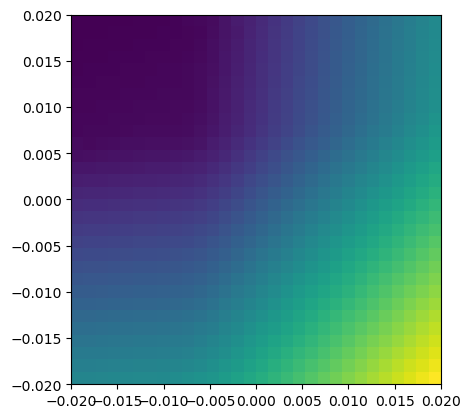

In [113]:
plot = plt.imshow(z, extent=(v_min, v_max, v_min, v_max))

### Phase sweet spot

In [8]:
system.optimize_phases()

In [39]:
system.optimal_phases

{'right-top': {'phi2': 2.839701343163615, 'phi1': 0},
 'left-top': {'phi2': 3.4072795345039233, 'phi1': 0},
 'left-right': {'phi1': 4.074499366464616, 'phi2': 0}}

In [10]:
options = cluster_options()
options.worker_cores = 1
options.worker_memory = 2
options.extra_path = "/home/jtorresluna/trijunction-design/"

In [11]:
params = parameters.junction_parameters()
params.update(potential=system.flat_potential())

phis = np.linspace(0, 2, 100) * np.pi
phases = {}

for pair in pairs:
    phases[pair] = [parameters.phase_pairs(pair, phi) for phi in phis]

In [12]:
linear_hams = [sum(
        parameters.voltage_dict(volts)[key] * system.linear_terms[key] for key in system.linear_terms.keys()
    ) for volts in system.initial_conditions.values()]

In [13]:
%%time
cluster = Cluster(options)
cluster.scale(50)
client = cluster.get_client()
client.wait_for_workers(1)
print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/33cab24a8b4a4cfdbaff50b303007b78/status
CPU times: user 361 ms, sys: 59.5 ms, total: 421 ms
Wall time: 55.8 s


In [14]:
scattered_trijunction = client.scatter(system.trijunction, broadcast=True)

In [15]:
scattered_f_params = client.scatter(system.f_params, broadcast=True)

In [16]:
scattered_linear_terms = client.scatter(linear_hams, broadcast=True)

In [17]:
%%time
phase_relations = {}
for i, pair in enumerate(pairs):
    futures = client.map(
        diagonalisation,
        phases[pair],
        trijunction=scattered_trijunction,
        f_params=scattered_f_params,
        linear_terms=scattered_linear_terms[i],
        params=params
    )
    phase_relations[pair] = client.gather(futures)

CPU times: user 19 s, sys: 2.61 s, total: 21.7 s
Wall time: 1min 28s


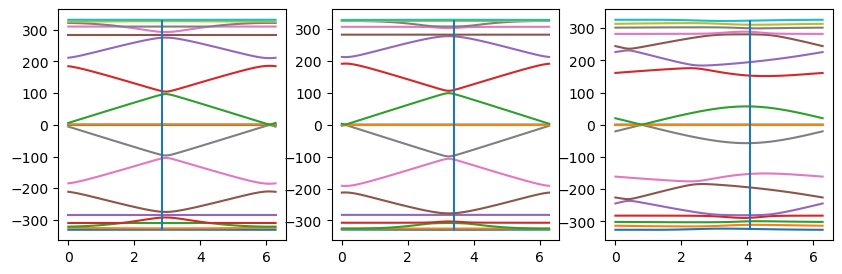

In [18]:
fig, ax = plt.subplots(ncols=3, figsize=(10, 3))
for i, pair in enumerate(pairs):
    spectra = 1e6*np.array(phase_relations[pair])
    ax[i].plot(phis, spectra)
    ax[i].vlines(x=list(system.optimal_phases[pair].values())[0], ymin=np.min(spectra), ymax=np.max(spectra))

### Adaptive sampling

In [190]:
options = cluster_options()
options.worker_cores = 1
options.worker_memory = 4
options.extra_path = "/home/jtorresluna/trijunction-design/"

ServerDisconnectedError: Server disconnected

2022-11-03 10:30:44,791 - tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <tornado.platform.asyncio.AsyncIOMainLoop object at 0x7ffbc8f51a20>>, <Task finished name='Task-74687' coro=<Client._update_scheduler_info() done, defined at /opt/conda/lib/python3.10/site-packages/distributed/client.py:1324> exception=ValueError('IOStream is not idle; cannot convert to SSL')>)
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/tornado/ioloop.py", line 741, in _run_callback
    ret = callback()
  File "/opt/conda/lib/python3.10/site-packages/tornado/ioloop.py", line 765, in _discard_future_result
    future.result()
  File "/opt/conda/lib/python3.10/site-packages/distributed/client.py", line 1328, in _update_scheduler_info
    self._scheduler_identity = SchedulerInfo(await self.scheduler.identity())
  File "/opt/conda/lib/python3.10/site-packages/distributed/core.py", line 1151, in send_recv_from_

In [ ]:
cluster = await Cluster(options, asynchronous=True)

await cluster.scale(100)
client = await cluster.get_client()
await client.wait_for_workers(1)
print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

In [ ]:
def density(wf):
    density = np.zeros(int(len(wf) / 4))
    for i in range(len(density)):
        density[i] = np.sum(np.abs(wf[4 * i : 4 * (i + 1)])**2)
    return density


def wavefunction_loss(x, *argv):
    """
    Soft-thresholding with wavefunction
    
    Input
    -----
    x: nx1 array
    Wavefunction
    
    densityoperator: kwant operator
    
    indices: dict
    Values are the indices corresponding to the position at which the and wavefunction probability is evaluated.
    Keys are the region names. Channel indices are represented as `left0`, `right0`, `top0`, whereas regions below 
    the gates are represented as `left_1`, `right_1`, `top_1` (with an underscore).
    
    pair: list
    Channel names those need to be coupled.
    
    ci: int
    Confidence interval (%) for the relative magnitude of the wavefunction density across two channels to be coupled.
    
    
    Returns
    -------
    loss: float
    """
    # unpack arguments
    if len(x.shape) == 1:
        # print(x)

        system, params, linear_terms, f_params, reference_wavefunctions = argv[0]
        pair, indices, (ci, wf_amp) = argv[1]

        params.update(voltage_dict(x))

        _, full_hamiltonian = hamiltonian(
                system, linear_terms, f_params, **params
            )
        
        energies, wfs = eigsh(
                full_hamiltonian.tocsc(),
                6,
                sigma=0,
                return_eigenvectors=True,
            )
        
    else:
        pair, indices, (ci, wf_amp) = argv
        wfs = x
    
    amplitude = lambda i: optimization._amplitude(pair, indices, density(wfs[:, i]))
    
    desired, undesired = [], []
    for i in range(3):
        des, undes = amplitude(i)
        desired.append(list(des.values()))
        undesired.append(undes)
        
    desired = np.vstack(desired)

    desired = np.array([np.sum(desired[0::2], axis=0), 
                        np.sum(desired[1::2], axis=0)]
                      )


    sum_desired = np.abs(np.sum(desired, axis=1))
    
    rel_amplitude = sum_desired[0] / sum_desired[1]
    rel_des_undes = sum(sum_desired)/np.sum(undesired)
    
    
    uniformity = np.abs(np.sum(np.diff(desired, axis=0)))

    if (
        (np.abs(1 - rel_amplitude) < ci / 100) 
        and rel_des_undes > 10
       ):
        try:
            desired, _ = optimization.majorana_loss(energies,
                                       wfs, 
                                       reference_wavefunctions)
            if desired > 1e-6:
                return -1
        except (AttributeError, UnboundLocalError):
            pass
    
    
    return (
        - sum(sum_desired)
        # - np.sum(desired)
        + uniformity
        + 1e1*np.sum(undesired)
    )

In [ ]:
def adaptive_loss(xy, argv, pair, initial_condition, indices):
    """
    Function used to compute coupling energy, wavefunction_loss and loss
    as a function of two voltages with adaptive.
    """
    system, linear_terms, reference_wavefunctions = argv

    sides = ["left", "right", "top"]
    for i, key in enumerate(pair):
        if key in sides:
            initial_condition[sides.index(key)] = xy[i]

    params = parameters.voltage_dict(initial_condition)

    linear_ham, full_hamiltonian = hamiltonian(system, linear_terms, **params)

    energies, wavefunctions = eigsh(
        full_hamiltonian.tocsc(),
        k=6,
        sigma=0,
        return_eigenvectors=True,
    )

    args = (pair, indices, (50, 1e-1))

    wf_loss = wavefunction_loss(wavefunctions, *args)

    maj_loss = (
        optimization.majorana_loss(energies, wavefunctions, reference_wavefunctions)
        / topological_gap
    )

    return {'energy': energies[-1], 'wf_loss': wf_loss, 'maj_loss': maj_loss}

In [186]:
pair = 'left-right'

params = parameters.junction_parameters()
params.update(potential=system.flat_potential())
params.update(system.optimal_phases[pair])
base_ham = system.trijunction.hamiltonian_submatrix(
    sparse=True,
    params=system.f_params(**params)
)

In [187]:
refrence_wfs = system.mlwf[order_wavefunctions(pair)]
opt_args = (
    base_ham,
    system.linear_terms,
    refrence_wfs
)

In [188]:
scattered_args = await client.scatter(opt_args, broadcast=True)

ValueError: IOStream is not idle; cannot convert to SSL

In [ ]:
scattered_indices = await client.scatter(system.indices, broadcast=True)

In [ ]:
from operator import itemgetter

plunger_min = -10e-3
plunger_max = 10e-3

bounds = [
    (plunger_min, plunger_max),
    (plunger_min, plunger_max),
]

async def f_async(xy):
    future = client.submit(
        adaptive_loss,
        xy,
        argv=scattered_args,
        pair=pair.split('-'),
        indices=scattered_indices,
        initial_condition=system.initial_conditions[pair]
    )

    return await future

_learner = adaptive.Learner2D(f_async, bounds=bounds)
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter("wf_loss"))

In [ ]:
runner = adaptive.AsyncRunner(
                learner,
                goal=lambda l: l.loss() < 0.003,
                ntasks=100
            )

In [ ]:
adaptive.notebook_extension()

2022-11-03 10:30:30,153 - tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <tornado.platform.asyncio.AsyncIOMainLoop object at 0x7ffbc8f51a20>>, <Task finished name='Task-74632' coro=<Client._update_scheduler_info() done, defined at /opt/conda/lib/python3.10/site-packages/distributed/client.py:1324> exception=ValueError('IOStream is not idle; cannot convert to SSL')>)
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/tornado/ioloop.py", line 741, in _run_callback
    ret = callback()
  File "/opt/conda/lib/python3.10/site-packages/tornado/ioloop.py", line 765, in _discard_future_result
    future.result()
  File "/opt/conda/lib/python3.10/site-packages/distributed/client.py", line 1328, in _update_scheduler_info
    self._scheduler_identity = SchedulerInfo(await self.scheduler.identity())
  File "/opt/conda/lib/python3.10/site-packages/distributed/core.py", line 1151, in send_recv_from_

In [189]:
runner.live_info()

2022-11-03 10:30:32,797 - tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <tornado.platform.asyncio.AsyncIOMainLoop object at 0x7ffbc8f51a20>>, <Task finished name='Task-74659' coro=<Client._update_scheduler_info() done, defined at /opt/conda/lib/python3.10/site-packages/distributed/client.py:1324> exception=ValueError('IOStream is not idle; cannot convert to SSL')>)
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/tornado/ioloop.py", line 741, in _run_callback
    ret = callback()
  File "/opt/conda/lib/python3.10/site-packages/tornado/ioloop.py", line 765, in _discard_future_result
    future.result()
  File "/opt/conda/lib/python3.10/site-packages/distributed/client.py", line 1328, in _update_scheduler_info
    self._scheduler_identity = SchedulerInfo(await self.scheduler.identity())
  File "/opt/conda/lib/python3.10/site-packages/distributed/core.py", line 1151, in send_recv_from_

In [145]:
_, _, z = learner.interpolated_on_grid()

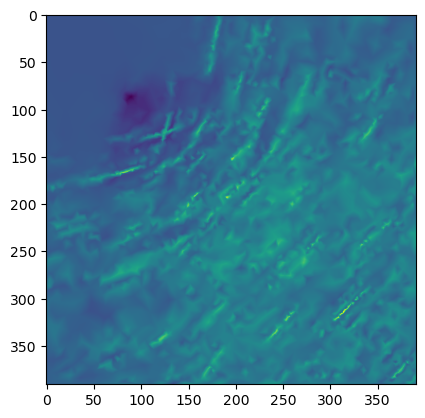

In [146]:
plt.imshow(z)

In [191]:
x = np.zeros(len(learner.extra_data))
y = np.zeros(len(learner.extra_data))
z = [[],[],[]]

for i, (key, value) in enumerate(learner.extra_data.items()):
    x[i] = key[0]
    y[i] = key[1]
    for j, result in enumerate(value.values()):
        z[j].append(result)

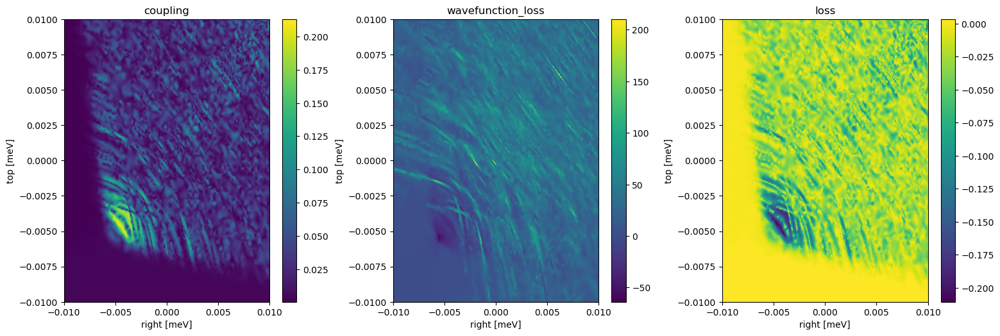

2022-11-03 10:39:59,914 - tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <tornado.platform.asyncio.AsyncIOMainLoop object at 0x7ffbc8f51a20>>, <Task finished name='Task-75346' coro=<Client._update_scheduler_info() done, defined at /opt/conda/lib/python3.10/site-packages/distributed/client.py:1324> exception=ValueError('IOStream is not idle; cannot convert to SSL')>)
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/tornado/ioloop.py", line 741, in _run_callback
    ret = callback()
  File "/opt/conda/lib/python3.10/site-packages/tornado/ioloop.py", line 765, in _discard_future_result
    future.result()
  File "/opt/conda/lib/python3.10/site-packages/distributed/client.py", line 1328, in _update_scheduler_info
    self._scheduler_identity = SchedulerInfo(await self.scheduler.identity())
  File "/opt/conda/lib/python3.10/site-packages/distributed/core.py", line 1151, in send_recv_from_

In [197]:
from scipy.interpolate import LinearNDInterpolator

fig, ax = plt.subplots(ncols=3, figsize=(15, 5))
fig.tight_layout(w_pad=5)
titles = ['coupling', 'wavefunction_loss', 'loss']
results = []
for i, element in enumerate(z):
    X = np.linspace(min(x), max(x), len(np.unique(x)))
    Y = np.linspace(min(y), max(y), len(np.unique(y)))
    X, Y = np.meshgrid(X, Y)  # 2D grid for interpolation
    interp = LinearNDInterpolator(list(zip(x, y)), element)
    Z = interp(X, Y)
    ax[i].set_title(titles[i])
    if i < 2:
        results.append(Z/topological_gap)
    else:
        results.append(Z)
    plot = ax[i].pcolormesh(X, Y, results[-1], shading='auto')
    plt.colorbar(plot, ax=ax[i])
    ax[i].set_xlabel('right [meV]')
    ax[i].set_ylabel('top [meV]')

In [1]:
plt.imshow(np.log(results[1]), extent=(-8, 8, 8, -8))

NameError: name 'plt' is not defined

In [320]:
learner.plot()

:Overlay
   .Image.I     :Image   [x,y]   (z)
   .EdgePaths.I :EdgePaths   [x,y]

Exception in callback None()
handle: <Handle cancelled>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/tornado/iostream.py", line 1391, in _do_ssl_handshake
    self.socket.do_handshake()
  File "/opt/conda/lib/python3.10/ssl.py", line 1342, in do_handshake
    self._sslobj.do_handshake()
ssl.SSLEOFError: EOF occurred in violation of protocol (_ssl.c:997)

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/asyncio/events.py", line 80, in _run
    self._context.run(self._callback, *self._args)
  File "/opt/conda/lib/python3.10/site-packages/tornado/platform/asyncio.py", line 189, in _handle_events
    handler_func(fileobj, events)
  File "/opt/conda/lib/python3.10/site-packages/tornado/iostream.py", line 696, in _handle_events
    self._handle_read()
  File "/opt/conda/lib/python3.10/site-packages/tornado/iostream.py", line 1478, in _handle_read
    self._do_ssl_han

In [78]:
x = np.zeros(len(learner.extra_data))
y = np.zeros(len(learner.extra_data))
z = [[],[],[]]

for i, (key, value) in enumerate(learner.extra_data.items()):
    x[i] = key[0]
    y[i] = key[1]
    for j, result in enumerate(value.values()):
        z[j].append(result)

In [79]:
z = np.array(z)

In [84]:
z[0]

array([2.21980125e-06, 1.08782941e-07, 1.78511782e-07, ...,
       5.54542604e-07, 8.48855865e-06, 4.93291888e-06])

TypeError: Invalid shape (2791,) for image data

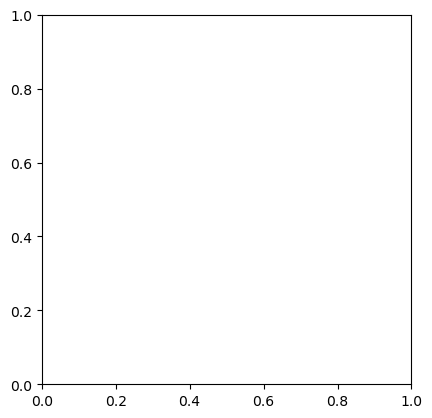

In [83]:
plt.imshow(z[0])

In [70]:
len(learner.extra_data.values())

2791

In [69]:
list(learner.extra_data.values())

[{'energy': 2.219801254718693e-06,
  'wf_loss': 0.5631656469955112,
  'maj_loss': -0.006588847916728962},
 {'energy': 1.087829409838108e-07,
  'wf_loss': 0.3761850417160586,
  'maj_loss': 0.00033861873589093586},
 {'energy': 1.7851178209358934e-07,
  'wf_loss': -0.021511069107620122,
  'maj_loss': 0.000549286076943636},
 {'energy': 4.99333719939639e-07,
  'wf_loss': 0.669583644800066,
  'maj_loss': -0.001193059854736203},
 {'energy': 2.0618172125729164e-07,
  'wf_loss': 0.281317463171176,
  'maj_loss': 0.0006149236682510716},
 {'energy': 5.9014787936285135e-06,
  'wf_loss': -0.04019017775408751,
  'maj_loss': -0.017722425562194204},
 {'energy': 1.6816761677678195e-07,
  'wf_loss': 0.003517236219981174,
  'maj_loss': 0.0005234715743229166},
 {'energy': 1.3175814042920313e-06,
  'wf_loss': -0.3931693441815395,
  'maj_loss': -0.003581704834630795},
 {'energy': 1.862526712237499e-07,
  'wf_loss': 0.4421822507806607,
  'maj_loss': 0.0005726735286187878},
 {'energy': 3.241980737724408e-07,
 

In [67]:
z

array([[ 2.21980125e-06,  5.63165647e-01, -6.58884792e-03, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 1.08782941e-07,  3.76185042e-01,  3.38618736e-04, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 1.78511782e-07, -2.15110691e-02,  5.49286077e-04, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [48]:
client.close()

## Scan of the loss function using adaptive 

In [149]:
options = cluster_options()
options.worker_cores = 1
options.worker_memory = 4
options.extra_path = "/home/jtorresluna/trijunction-design/"

In [150]:
cluster = await Cluster(options, asynchronous=True)

await cluster.scale(50)
client = await cluster.get_client()
await client.wait_for_workers(1)
print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/078adfea12c34ad384ac69e3901bca01/status


In [151]:
importlib.reload(optimization)

<module 'codes.optimization' from '/home/tinkerer/trijunction-design/analysis/codes/optimization.py'>

In [152]:
def adaptive_soft_loss(xy, keys, initial_condition, args):
    """
    wrapper of `shape_loss` for adaptive
    keys must be two dimensional
    """
    sides = ["left", "right", "top"]
    for i, key in enumerate(keys):
        if key in sides:
            initial_condition[sides.index(key)] = xy[i]
    return optimization.shape_loss(initial_condition, *args)

In [153]:
params = parameters.junction_parameters()
params.update(potential=system.flat_potential())
base_ham = system.trijunction.hamiltonian_submatrix(
    sparse=True,
    params=system.f_params(**params)
)

In [154]:
pair = 'left-right'
args = (
    pair.split('-'),
    (base_ham, system.linear_terms),
    system.indices
)

In [155]:
scattered_args = await client.scatter(args, broadcast=True)

In [156]:
plunger_min = -10e-3
plunger_max = 10e-3

bounds = [
    (plunger_min, plunger_max),
    (plunger_min, plunger_max),
]

In [157]:
async def f_async(xy):
    future = client.submit(
        adaptive_soft_loss,
        xy,
        keys=pair.split('-'),
        initial_condition=system.initial_conditions[pair],
        args=scattered_args
    )

    return await future

learner = adaptive.Learner2D(f_async, bounds=bounds)
runner = adaptive.AsyncRunner(
                learner,
                goal=lambda l: l.loss() < 0.01,
                ntasks=100
            )

In [158]:
runner.live_info()

Exception in callback None()
handle: <Handle cancelled>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/tornado/iostream.py", line 1391, in _do_ssl_handshake
    self.socket.do_handshake()
  File "/opt/conda/lib/python3.10/ssl.py", line 1342, in do_handshake
    self._sslobj.do_handshake()
ssl.SSLEOFError: EOF occurred in violation of protocol (_ssl.c:997)

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/asyncio/events.py", line 80, in _run
    self._context.run(self._callback, *self._args)
  File "/opt/conda/lib/python3.10/site-packages/tornado/platform/asyncio.py", line 189, in _handle_events
    handler_func(fileobj, events)
  File "/opt/conda/lib/python3.10/site-packages/tornado/iostream.py", line 696, in _handle_events
    self._handle_read()
  File "/opt/conda/lib/python3.10/site-packages/tornado/iostream.py", line 1478, in _handle_read
    self._do_ssl_han

In [160]:
_, _, z = learner.interpolated_on_grid()

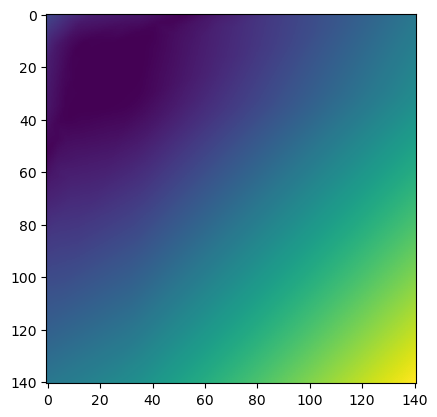

In [161]:
plt.imshow(z)

In [113]:
adaptive.notebook_extension()

In [125]:
runner.live_info()

In [126]:
learner.plot()

:Overlay
   .Image.I     :Image   [x,y]   (z)
   .EdgePaths.I :EdgePaths   [x,y]

2022-10-31 11:34:43,932 - distributed.client - ERROR - Failed to reconnect to scheduler after 30.00 seconds, closing client


In [38]:
options = cluster_options()
options.worker_cores = 1
options.worker_memory = 4
options.extra_path = "/home/jtorresluna/trijunction-design/"

In [39]:
params = parameters.junction_parameters()
params.update(potential=system.flat_potential())
base_ham = system.trijunction.hamiltonian_submatrix(
    sparse=True,
    params=system.f_params(**params)
)

In [40]:
cluster = await Cluster(options, asynchronous=True)

await cluster.scale(50)
client = await cluster.get_client()
await client.wait_for_workers(1)
print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/30290daa0c104b55acc33249277508e2/status


In [41]:
def adaptive_loss(xy, argv, pair, initial_condition, indices):
    """
    Function used to compute coupling energy, wavefunction_loss and loss
    as a function of two voltages with adaptive.
    """
    system, linear_terms, reference_wavefunctions = argv

    sides = ["left", "right", "top"]
    for i, key in enumerate(pair):
        if key in sides:
            initial_condition[sides.index(key)] = xy[i]

    params = parameters.voltage_dict(initial_condition)

    linear_ham, full_hamiltonian = hamiltonian(system, linear_terms, **params)

    energies, wavefunctions = eigsh(
        full_hamiltonian.tocsc(),
        k=6,
        sigma=0,
        return_eigenvectors=True,
    )

    args = (pair, indices, (10, 1))

    wf_loss = optimization.wavefunction_loss(wavefunctions, *args)

    args = (pair, (system, linear_terms), indices)
    shp_loss = optimization.shape_loss()

    return {'energy': energies[-1], 'wf_loss': wf_loss, 'shape_loss': shp_loss}

In [42]:
pair = 'left-right'
refrence_wfs = system.mlwf[order_wavefunctions(pair)]
opt_args = (
    base_ham,
    system.linear_terms,
    refrence_wfs
)

In [43]:
scattered_args = await client.scatter(opt_args, broadcast=True)

CancelledError: 

In [ ]:
scattered_indices = await client.scatter(system.indices, broadcast=True)

In [ ]:
from operator import itemgetter

plunger_min = -10e-3
plunger_max = 10e-3

bounds = [
    (plunger_min, plunger_max),
    (plunger_min, plunger_max),
]

async def f_async(xy):
    future = client.submit(
        adaptive_loss,
        xy,
        argv=scattered_args,
        pair=pair.split('-'),
        indices=scattered_indices,
        initial_condition=[-3e-3, -3e-3, -7e-3, 8e-3]
    )

    return await future

_learner = adaptive.Learner2D(f_async, bounds=bounds)
learner = adaptive.DataSaver(_learner, arg_picker=itemgetter("energy"))

In [ ]:
runner = adaptive.AsyncRunner(
                learner,
                goal=lambda l: l.loss() < 0.01,
                ntasks=100
            )

In [ ]:
adaptive.notebook_extension()

In [ ]:
runner.live_info()

In [63]:
x, y, z = learner.interpolated_on_grid()

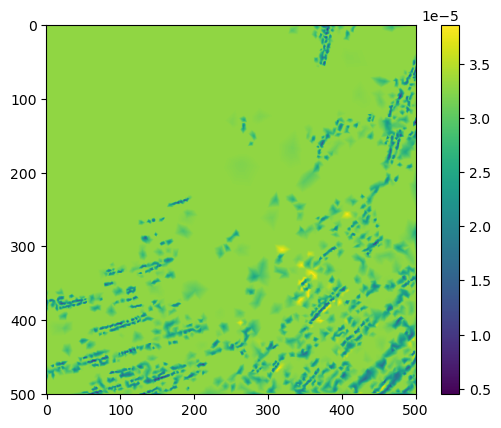

Exception in callback None()
handle: <Handle cancelled>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/tornado/iostream.py", line 1391, in _do_ssl_handshake
    self.socket.do_handshake()
  File "/opt/conda/lib/python3.10/ssl.py", line 1342, in do_handshake
    self._sslobj.do_handshake()
ssl.SSLEOFError: EOF occurred in violation of protocol (_ssl.c:997)

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/asyncio/events.py", line 80, in _run
    self._context.run(self._callback, *self._args)
  File "/opt/conda/lib/python3.10/site-packages/tornado/platform/asyncio.py", line 189, in _handle_events
    handler_func(fileobj, events)
  File "/opt/conda/lib/python3.10/site-packages/tornado/iostream.py", line 696, in _handle_events
    self._handle_read()
  File "/opt/conda/lib/python3.10/site-packages/tornado/iostream.py", line 1478, in _handle_read
    self._do_ssl_han

In [65]:
plot = plt.imshow(z)
plt.colorbar(plot)

In [49]:
cluster.close()

# Multiple geometries

In [26]:
n_goemetries = 5
widths = np.linspace(15, 40, n_goemetries)

In [15]:
options = cluster_options()
options.worker_cores = 1
options.worker_memory = 10
options.extra_path = "/home/jtorresluna/trijunction-design/"

In [16]:
%%time

cluster = Cluster(options)

cluster.scale(n_goemetries)
client = cluster.get_client()
client.wait_for_workers(1)
print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/e17fe383e91044b8bcb32e5ba50cdce0/status
CPU times: user 360 ms, sys: 63.3 ms, total: 423 ms
Wall time: 46.9 s


In [17]:
scattered_config = client.scatter(config, broadcast=True)

In [18]:
def modify_config(key_1, key_2, val):
    return [
        {key_1: {key_2: val}}
    ]


def trijunction_matrices(new_val, config, key_2='channel_width', key_1='gate'):
    change_config = modify_config(key_1, key_2, new_val)
    for local_config in change_config:
        config = dict_update(config, local_config)

    system = trijunction.Trijunction(config, optimize_phase_pairs=pairs)
    return system.optimal_base_hams, system.linear_terms

In [19]:
kwargs = {'config': scattered_config}
futures = client.map(
    trijunction_matrices,
    widths,
    **kwargs
)

In [20]:
trijunctions = client.gather(futures)

In [21]:
import importlib
importlib.reload(parameters)

<module 'codes.parameters' from '/home/tinkerer/trijunction-design/analysis/codes/parameters.py'>

In [22]:
voltages = parameters.voltage_initial_conditions()

In [36]:
def evaluate_voltages(trijunctions, voltages, base_ham=False):
    result = []
    for matrix in trijunctions:
        geometry_results = []
        for voltage in voltages.values():
            voltage = parameters.voltage_dict(voltage)
            potential = sum([voltage[key] * matrix[1][key] for key in voltage.keys()])
            potential = potential.diagonal()[::4]
            geometry_results.append(potential)
        result.append(geometry_results)
    return result

In [32]:
def initialize_kwant(config):
    (
        gates_vertex,
        gate_names,
        boundaries,
        nw_centers,
    ) = gate_coords(config)
    geometry, trijunction, f_params = kwantsystem(
            config, boundaries, nw_centers, 10e-9
        )
    return trijunction

In [33]:
tjs_objects = []
for w in widths:
    change_config = modify_config(key_1='gate', key_2='channel_width', val=w)
    for local_config in change_config:
        config = dict_update(config, local_config)
    system = initialize_kwant(config)
    tjs_objects.append(system)


In [34]:
len(tjs_objects[0].sites)

11550

In [37]:
potentials = evaluate_voltages(trijunctions, voltages)

In [38]:
np.shape(potentials)

/opt/conda/lib/python3.10/site-packages/numpy/core/fromnumeric.py:2007: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


(5, 3)

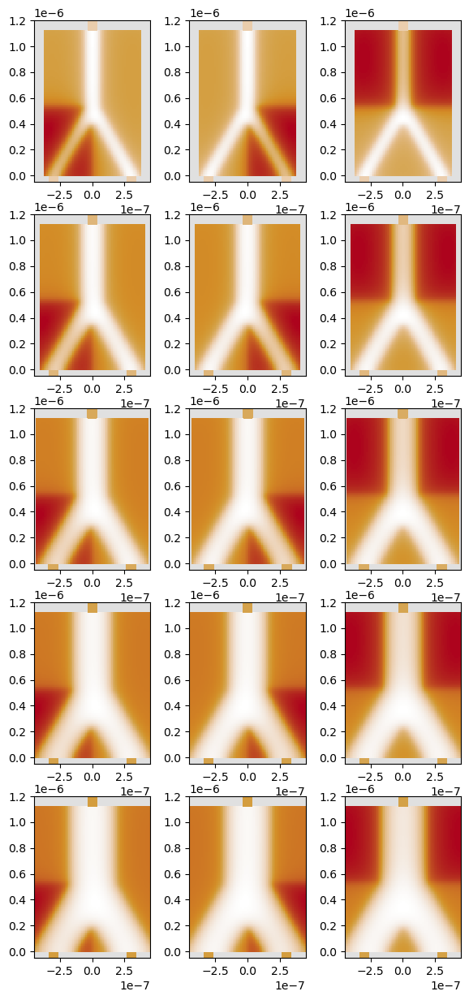

In [42]:
fig, ax = plt.subplots(nrows=len(trijunctions), ncols=3, figsize=(7, 15))

for i in range(len(ax)):
    for j in range(len(ax[0])):
        kwant.plotter.map(
            tjs_objects[i],
            lambda k: np.real(potentials[i][j][k]),
            ax=ax[i][j]
        )
        ax[i][j].set_ylim(-.5e-7, 12e-7)
        ax[i][j].set_xlim(-4.5e-7, 4.5e-7)

In [85]:
voltages = parameters.pair_voltages()

In [86]:
plunger_min = -7e-3
plunger_max = 7e-3

bounds = [
    (plunger_min, plunger_max),
    (plunger_min, plunger_max),
]

In [87]:
options = cluster_options()
options.worker_cores = 1
options.worker_memory = 4
options.extra_path = "/home/jtorresluna/trijunction-design/"

In [91]:
cluster = await Cluster(options, asynchronous=True)

await cluster.scale(100)
client = await cluster.get_client()
await client.wait_for_workers(1)
print("http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/"+cluster.dashboard_link[17:])

http://io.quantumtinkerer.tudelft.nl/user/jdtorres/proxy/8000/clusters/50044acb71b74743817db40ed7904d15/status


In [92]:
# cuts along accumulation voltage
accumulation_voltages = np.arange(5, 10) * 1e-3
accumulation_voltages

array([0.005, 0.006, 0.007, 0.008, 0.009])

In [93]:
geometry_results = {}

for i, geometry in enumerate(trijunctions[1::]):
    i += 1
    base_hams, linear_terms = geometry
    scattered_linear_matrices = await client.scatter(linear_terms, broadcast=True)
    pair_couplings = {}

    for key, value in base_hams.items():
        accum_couplings = {}
        scattered_base_ham = await client.scatter(value, broadcast=True)

        for voltage in accumulation_voltages:
            voltages[key]['global_accumul'] = voltage

            async def f_async(xy):
                future = client.submit(
                    adaptive_two_parameters,
                    xy,
                    trijunction=scattered_base_ham,
                    linear_terms=scattered_linear_matrices,
                    keys=key.split('-'),
                    params=voltages[key]
                )

                return await future

            learner = adaptive.Learner2D(f_async, bounds=bounds)
            runner = adaptive.AsyncRunner(
                            learner,
                            goal=lambda l: l.loss() < 0.01,
                            ntasks=100
                        )

            await runner.task
            _, _, z = learner.interpolated_on_grid()

            with open(f'../data/{i}_{key}_{voltage}.pickle', 'wb') as handle:
                pickle.dump(z, handle, protocol=pickle.HIGHEST_PROTOCOL)

            accum_couplings[voltage] = z

        with open(f'../data/{i}_{key}.pickle', 'wb') as handle:
            pickle.dump(accum_couplings, handle, protocol=pickle.HIGHEST_PROTOCOL)

        pair_couplings[key] = accum_couplings

    geometry_results[i] = pair_couplings

Unclosed client session
client_session: <aiohttp.client.ClientSession object at 0x7f6309f74f70>
2022-10-26 11:58:05,463 - distributed.client - ERROR - Failed to reconnect to scheduler after 30.00 seconds, closing client


RuntimeError: An error occured while evaluating "learner.function((0.005674897119341564, 0.002736625514403292))". See the traceback for details.:

Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/adaptive/runner.py", line 224, in _process_futures
    y = fut.result()
  File "/tmp/ipykernel_10233/2455043576.py", line 26, in f_async
    return await future
  File "/opt/conda/lib/python3.10/site-packages/distributed/client.py", line 289, in _result
    raise exc.with_traceback(tb)
  File "/home/jtorresluna/trijunction-design/codes/system_functions.py", line 35, in adaptive_two_parameters
  File "/home/jtorresluna/trijunction-design/codes/system_functions.py", line 86, in diagonalisation
  File "/home/jtorresluna/trijunction-design/codes/utils.py", line 50, in eigsh
  File "/home/jtorresluna/trijunction-design/codes/utils.py", line 30, in __init__
  File "/opt/conda/lib/python3.10/site-packages/kwant/linalg/mumps.py", line 339, in factor
    raise MUMPSError(self.mumps_instance.infog)
kwant.linalg.mumps.MUMPSError: MUMPS failed with error o.


Exception in callback None()
handle: <Handle cancelled>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/tornado/iostream.py", line 1391, in _do_ssl_handshake
    self.socket.do_handshake()
  File "/opt/conda/lib/python3.10/ssl.py", line 1342, in do_handshake
    self._sslobj.do_handshake()
ssl.SSLEOFError: EOF occurred in violation of protocol (_ssl.c:997)

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/asyncio/events.py", line 80, in _run
    self._context.run(self._callback, *self._args)
  File "/opt/conda/lib/python3.10/site-packages/tornado/platform/asyncio.py", line 189, in _handle_events
    handler_func(fileobj, events)
  File "/opt/conda/lib/python3.10/site-packages/tornado/iostream.py", line 696, in _handle_events
    self._handle_read()
  File "/opt/conda/lib/python3.10/site-packages/tornado/iostream.py", line 1478, in _handle_read
    self._do_ssl_han